<a href="https://colab.research.google.com/github/hadi-yazdi/courtyard_feature_extraction/blob/main/courtyard_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Instance Segmentation with Detectron2 and Remo

In this tutorial, we do transfer learning on a MaskRCNN model from Detectron2. 
We use Remo to facilitate exploring, accessing and managing the dataset.




In particular, we will:

* Browse through our images and annotations
* Quickly visualize the main properties of the dataset and make some initial observations
* Create a train, test, valid split without moving data around, using Remo image tags.
* Fine tune a pre-trained MaskRCNN model from Detectron2 and do some inference
* Visually compare Mask predictions with the ground truth, and draw possible conclusions on how to improve performance



**Along the way, we will see how browsing images, annotations and predictions helps to gather insights on the dataset and on the model.**

Before proceeding, we need to install the required dependencies. 

This can be done by executing the next cell. Once complete, **restart your runtime** to ensure that the installed packages can be detected.

This tutorial is supported to run only on a **CUDA enabled GPU** locally or on Google Colab.


In [ ]:
!pip install imantics
!pip install git+https://github.com/facebookresearch/fvcore.git
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-do8mv8kp
  Running command git clone -q https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-do8mv8kp
fatal: destination path 'detectron2_repo' already exists and is not an empty directory.
Obtaining file:///content/detectron2_repo
  Attempting uninstall: detectron2
    Found existing installation: detectron2 0.5
    Can't uninstall 'detectron2'. No files were found to uninstall.
  Running setup.py develop for detectron2


In [ ]:
from google.colab import drive
GDRIVE_ROOT = '/gdrive'
drive.mount(GDRIVE_ROOT)

Mounted at /gdrive


In [ ]:
!pip install remo
!python -m remo_app init --colab

     |████████████████████████████████| 14.3 MB 5.1 MB/s 
     |████████████████████████████████| 448 kB 55.0 MB/s 
     |████████████████████████████████| 148 kB 64.1 MB/s 
     |████████████████████████████████| 69 kB 10.4 MB/s 
     |████████████████████████████████| 57 kB 8.1 MB/s 
     |████████████████████████████████| 7.5 MB 58.0 MB/s 
     |████████████████████████████████| 545 kB 64.8 MB/s 
     |████████████████████████████████| 3.2 MB 50.7 MB/s 
     |████████████████████████████████| 72 kB 1.2 MB/s 
     |████████████████████████████████| 65 kB 5.2 MB/s 
     |████████████████████████████████| 911 kB 51.6 MB/s 
     |████████████████████████████████| 53 kB 2.5 MB/s 
     |████████████████████████████████| 133 kB 70.4 MB/s 
     |████████████████████████████████| 58 kB 8.2 MB/s 
  Created wheel for django-allauth: filename=django_allauth-0.41.0-py3-none-any.whl size=855166 sha256=78647af0d391f8d735c3b68029bedd1933baeb18190daf3db6aa782bf4bd39b9
  Stored in directory: /root/.c


    (\(\
    (>':')  Remo: v0.6.1
Python: 3.7.11, Linux-5.4.104+-x86_64-with-Ubuntu-18.04-bionic

Initiailizing Remo:

This will download and install the following packages as needed: 
   * openssl
   * apt-transport-https
   * ca-certificates
   * unzip
   * libpq-dev
   * python3-dev
   * unzip
   * vips
   * postgres
   * supervisor
   * ngrok

Remo Terms of Service: https://remo.ai/docs/terms/

Do you want to continue with the installation of remo? [Y/n]: y
Installing Remo to dir: /gdrive/My Drive/RemoApp

[-] Installing OS specific tools
$ sudo apt-get update -qq
$ sudo apt-get install -y -qq openssl
$ sudo apt-get install -y -qq apt-transport-https ca-certificates unzip libpq-dev python3-dev

Completed - components installed
--------------------------------------------------

[-] Installing vips lib
$ sudo apt-get install -y -qq libvips-dev

Completed - components installed
--------------------------------------------------

[-] Installing postgres
$ sudo apt-get install -y -qq 

Let us then import the required packages.

In [ ]:
import remo
remo.set_viewer('jupyter')

import numpy as np
import os
from PIL import Image
import glob
import random
random.seed(600)

from imantics import Polygons, Mask

import torch, torchvision

# Detectron 2 files
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.engine import DefaultTrainer
from detectron2.data.datasets import register_coco_instances
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

## Adding Data to Remo

* The Dataset used is a subset of the <a href="https://cocodataset.org/#home">MS COCO Dataset</a>.
* The directory structure of the dataset is:
```
├── coco_instance_segmentation_dataset
    ├── images
        ├── image_1.jpg
        ├── image_2.jpg
        ├── ...
    ├── annotations
        ├── coco_instance_segmentation.json
```


In [ ]:
# The dataset will be extracted in a new folder
# if not os.path.exists(GDRIVE_ROOT + '/My Drive/coco_instance_segmentation_dataset.zip'):
#     !wget https://s-3.s3-eu-west-1.amazonaws.com/coco_instance_segmentation_dataset.zip -P '/gdrive/My Drive'
#     !unzip -qq '/gdrive/My Drive/coco_instance_segmentation_dataset.zip' -d '/gdrive/My Drive/'
# else:
#     print('Files already downloaded')

In [ ]:
# The path to the folders
path_to_images =  os.path.join(GDRIVE_ROOT + '/My Drive/', 'courtyard_segmentation/images/')
path_to_annotations = os.path.join(GDRIVE_ROOT + '/My Drive/', 'courtyard_segmentation/annotations/')

In [ ]:
im_list = [i for i in glob.glob(path_to_images + '/**/*.jpg', recursive=True)]
im_list = random.sample(im_list, len(im_list))

train_idx = round(len(im_list) * 0.9)
test_idx  = train_idx + round(len(im_list) * 0.1)

tags_dict =  {'train' : im_list[0:train_idx], 
              'test' : im_list[train_idx:test_idx]}

train_test_split_file_path = os.path.join(path_to_annotations, 'images_tags.csv') 
remo.generate_image_tags(tags_dictionary  = tags_dict, 
                         output_file_path = train_test_split_file_path, 
                         append_path = False)

'/gdrive/My Drive/courtyard_segmentation/annotations/images_tags.csv'

## Train / test split
In Remo, we can use tags to organise our images. Among other things, this allows us to generate train / test splits without the need to move image files around.

To do this, we just need to pass a dictionary (mapping tags to the relevant images paths) to the function ```remo.generate_image_tags()```.

### Create a dataset

To create a dataset we can use ```remo.create_dataset()```, specifying the path to data and annotations.

For a complete list of formats supported, you can <a href="https://remo.ai/docs/annotation-formats/"> refer to the docs</a>.


In [ ]:
coco_instance_segmentation_dataset = remo.create_dataset(name = 'coco_instance_segmentation_dataset', local_files = [path_to_annotations, path_to_images], annotation_task='Instance Segmentation')

Acquiring data - completed                                                                           
Processing annotation files: 2 of 2 files                                                            Processing data - completed                                                                          
Data upload completed with some errors:
1419-R10_61_15.jpg: No valid url
1178-R9_62_3.jpg: No valid url
1176-R9_34_14.jpg: No valid url
1176-R9_45_5.jpg: No valid url
1423-R10_55_6.jpg: No valid url
1180-R9_53_9.jpg: No valid url
1423-R10_73_14.jpg: No valid url
1180-R9_41_1.jpg: No valid url
1176-R9_31_1.jpg: No valid url
1178-R9_52_14.jpg: No valid url
1178-R9_54_7.jpg: No valid url
1180-R9_32_7.jpg: No valid url
1419-R10_53_1.jpg: No valid url
1534-R11_31_7.jpg: No valid url
1532-R11_31_5.jpg: No valid url
1419-R10_33_17.jpg: No valid url
1176-R9_43_8.jpg: No valid url
1178-R9_52_17.jpg: No valid url
1176-R9_31_4.jpg: No valid url
1176-R9_21_5.jpg: No valid url
1176-R9_23_14.jpg: No 

**Visualizing the dataset**

To view and explore images and labels, we can use Remo directly from the notebook. We just need to call ```dataset.view()```.

In [ ]:
# coco_instance_segmentation_dataset.view()

**Looking at the dataset, we notice some interesting points:**

- Pictures of the animals can be taken from different angles

- In some cases, there is an overlap of classes such that it represents an occlusion i.e Zebra right beside a Giraffe.

- The actual pose of the same object varies across instances.

**Dataset Statistics**

Using Remo, we can quickly visualize some key Dataset properties that can help us with our modelling, without needing to write extra boilerplate code.

This can be done either from code, or using the visual interface.

In [ ]:
coco_instance_segmentation_dataset.get_annotation_statistics()

[{'AnnotationSet ID': 57,
  'AnnotationSet name': 'Instance segmentation',
  'creation_date': None,
  'last_modified_date': '2021-08-20T10:58:32.018872Z',
  'n_classes': 4,
  'n_images': 550,
  'n_objects': 2389,
  'top_3_classes': [{'count': 866, 'name': 'Grass'},
   {'count': 552, 'name': 'Yard'},
   {'count': 546, 'name': 'Shadow'}]}]

In [ ]:
# coco_instance_segmentation_dataset.view_annotation_stats()

**Looking at the statistics we can gain some useful insights like:**

- The highest number of instances per image is that of Zebra. This means we have a somewhat unbalanced dataset, and we might expect to see the model perfom better on Zebras

- The data distribution looks similar in both train and test dataset. This is good!

**Exporting the dataset**

To export annotations according to the train, test split in a format accepted by the model, we use the ```dataset.export_annotations_to_file()``` method, and filter by the desired tag.

For a complete list of formats supported, you can <a href="https://remo.ai/docs/annotation-formats/"> refer to the docs</a>.

In [ ]:
path_to_train = path_to_annotations + 'segmentation_train.json'
path_to_test = path_to_annotations + 'segmentation_test.json'

In [ ]:
coco_instance_segmentation_dataset.export_annotations_to_file(path_to_train, annotation_format='coco', filter_by_tags=['train'], export_tags=False, append_path=False)
coco_instance_segmentation_dataset.export_annotations_to_file(path_to_test, annotation_format='coco', filter_by_tags=['test'], export_tags=False, append_path=False)

# Detectron2

Here we will start working with the ```Detectron2``` framework written in PyTorch.

## Feeding Data into Detectron2

To use Detectron2, you are required to register your dataset.

The ```register_coco_instances``` method takes in the following parameters:

* **path_to_annotations:** Path to annotation files. Format: COCO JSON.

* **path_to_images:** Path to the folder containing the images.

This then allows to store the metadata for future operations.

In [ ]:
register_coco_instances('coco_instance_segmentation_train', {}, path_to_train, path_to_images)
register_coco_instances('coco_instance_segmentation_test', {}, path_to_test, path_to_images)

train_metadata = MetadataCatalog.get('coco_instance_segmentation_train')

## Training the Model

For the sake of the tutorial, our ```Mask RCNN``` architecture will have a ```ResNet-50 Backbone```, pre-trained on on COCO train2017. This can be loaded directly from Detectron2.

To train the model, we specify the following details:

- **model_yaml_path:** Configuration file for the Mask RCNN model.

- **model_weights_path**: Symbolic link to the desired Mask RCNN architecture.

The parameters can be tweaked by overriding the correspodning variable in the ```cfg```.

In [ ]:
model_yaml_path = './detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml'
model_weights_path = 'detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl'

cfg = get_cfg()
cfg.merge_from_file(model_yaml_path)
cfg.DATASETS.TRAIN = ('coco_instance_segmentation_train',)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_weights_path # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.005
cfg.SOLVER.MAX_ITER = 1000    # 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 2048  # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4

**Instantiating the Trainer**

We instatiate the trainer with the required configuration, and finally kick-off the training.

In [ ]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[08/20 11:35:06 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (5, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (5,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (16, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (16,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (4, 256, 1, 1) 

[08/20 11:35:06 d2.engine.train_loop]: Starting training from iteration 0
[08/20 11:35:20 d2.utils.events]:  eta: 0:10:58  iter: 19  total_loss: 2.499  loss_cls: 1.551  loss_box_reg: 0.17  loss_mask: 0.6918  loss_rpn_cls: 0.0519  loss_rpn_loc: 0.03263  time: 0.6788  data_time: 0.0346  lr: 9.9905e-05  max_mem: 5602M
[08/20 11:35:34 d2.utils.events]:  eta: 0:10:44  iter: 39  total_loss: 1.225  loss_cls: 0.2797  loss_box_reg: 0.1821  loss_mask: 0.6766  loss_rpn_cls: 0.04472  loss_rpn_loc: 0.03087  time: 0.6806  data_time: 0.0241  lr: 0.0001998  max_mem: 5602M
[08/20 11:35:48 d2.utils.events]:  eta: 0:10:30  iter: 59  total_loss: 1.13  loss_cls: 0.247  loss_box_reg: 0.1854  loss_mask: 0.6335  loss_rpn_cls: 0.02894  loss_rpn_loc: 0.02558  time: 0.6821  data_time: 0.0259  lr: 0.0002997  max_mem: 5602M
[08/20 11:36:02 d2.utils.events]:  eta: 0:10:21  iter: 79  total_loss: 1.06  loss_cls: 0.2303  loss_box_reg: 0.1923  loss_mask: 0.5682  loss_rpn_cls: 0.01862  loss_rpn_loc: 0.02442  time: 0.687

**Performance Metrics**

In order to evaluate the model performance on metrics such as Average Precision (AP) and Mean Average Precision (mAP), we will use the ```COCOEvaluator``` in the detectron2 package.

In [ ]:
evaluator = COCOEvaluator("coco_instance_segmentation_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "coco_instance_segmentation_test")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

WARNING [08/20 11:57:35 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[08/20 11:57:35 d2.data.datasets.coco]: Loaded 55 images in COCO format from /gdrive/My Drive/courtyard_segmentation/annotations/segmentation_test.json
[08/20 11:57:35 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/20 11:57:35 d2.data.common]: Serializing 55 elements to byte tensors and concatenating them all ...
[08/20 11:57:35 d2.data.common]: Serialized dataset takes 0.03 MiB
[08/20 11:57:35 d2.evaluation.evaluator]: Start inference on 55 batches
[08/20 11:57:36 d2.evaluation.evaluator]: Inference done 11/55. Dataloading: 0.0010 s/iter. Inference: 0.0603 s/iter. Eval: 0.0018 s/iter. Total: 0.0631 s/iter. ETA=0:00:02
[08/20 11:57:39 d2.evaluation.evaluator]: Total inference time: 0:00:03.442374 (0.0

## Visualizing Predictions

Using Remo, we can easily browse our predictions and compare them with the ground-truth.

We will do this by uploading the model predictions to a new ```AnnotationSet```, which we call `model_predictions`

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, 'model_final.pth')
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ('coco_instance_segmentation_test', )
predictor = DefaultPredictor(cfg)
test_dataset_dicts = DatasetCatalog.get('coco_instance_segmentation_test')

[08/20 11:57:58 d2.data.datasets.coco]: Loaded 55 images in COCO format from /gdrive/My Drive/courtyard_segmentation/annotations/segmentation_test.json


To visualize the labels as strings rather than IDs, we can use a dictionary mapping the two of them.

In [ ]:
mapping = {k: v for k, v in enumerate(train_metadata.thing_classes)}

In [ ]:
# for d in test_dataset_dicts:    
#     im = np.array(Image.open(d['file_name']))
#     outputs = predictor(im)
#     pred_classes = outputs['instances'].get('pred_classes').cpu().numpy()
#     masks = outputs['instances'].get('pred_masks').cpu().permute(1, 2, 0).numpy()
#     image_name = d['file_name']
#     annotations = []
    
#     if masks.shape[2] != 0:
#         for i in range(masks.shape[2]):
#             polygons = Mask(masks[:, :, i]).polygons()
#             annotation = remo.Annotation()
#             annotation.img_filename = image_name
#             annotation.classes = mapping[pred_classes[i]]
#             annotation.segment = polygons.segmentation[0]
#             annotations.append(annotation)
#     else:
#         polygons = Mask(masks[:, :, 0]).polygons()
#         annotation = remo.Annotation()
#         annotation.img_filename = image_name
#         annotation.classes = mapping[pred_classes[0]]
#         annotation.segment = polygons.segmentation[0]
#         annotations.append(annotation)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


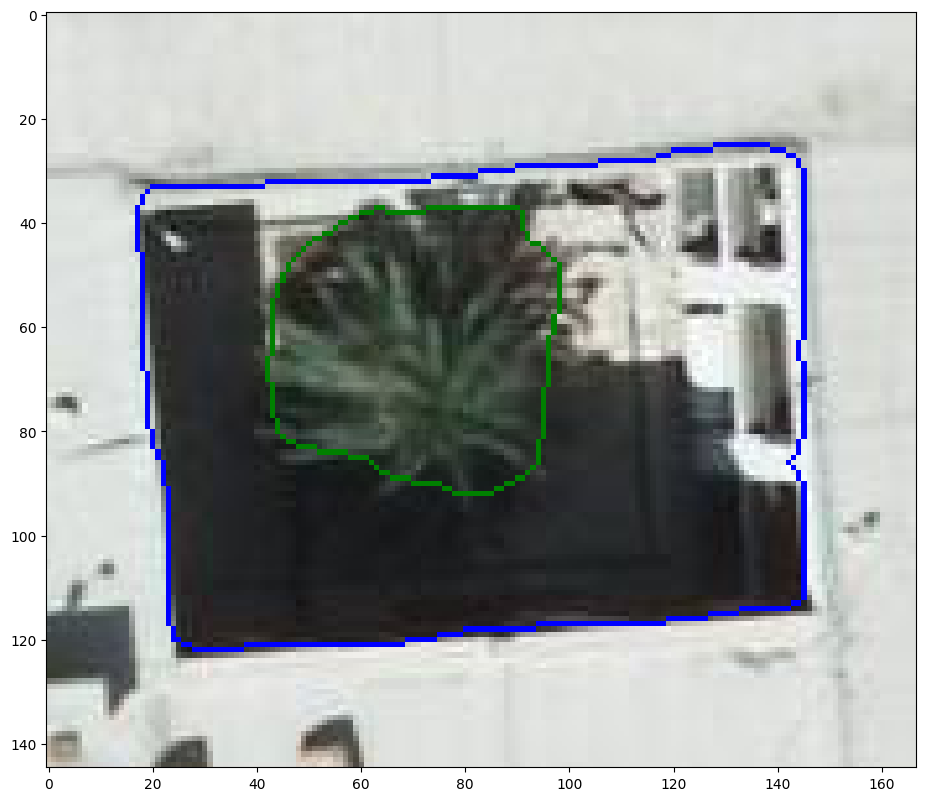

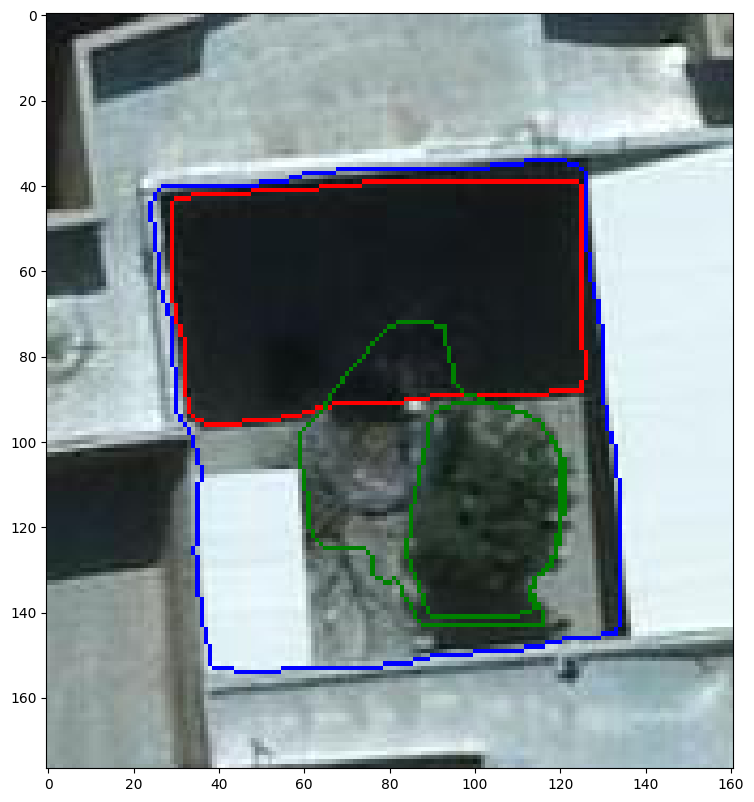

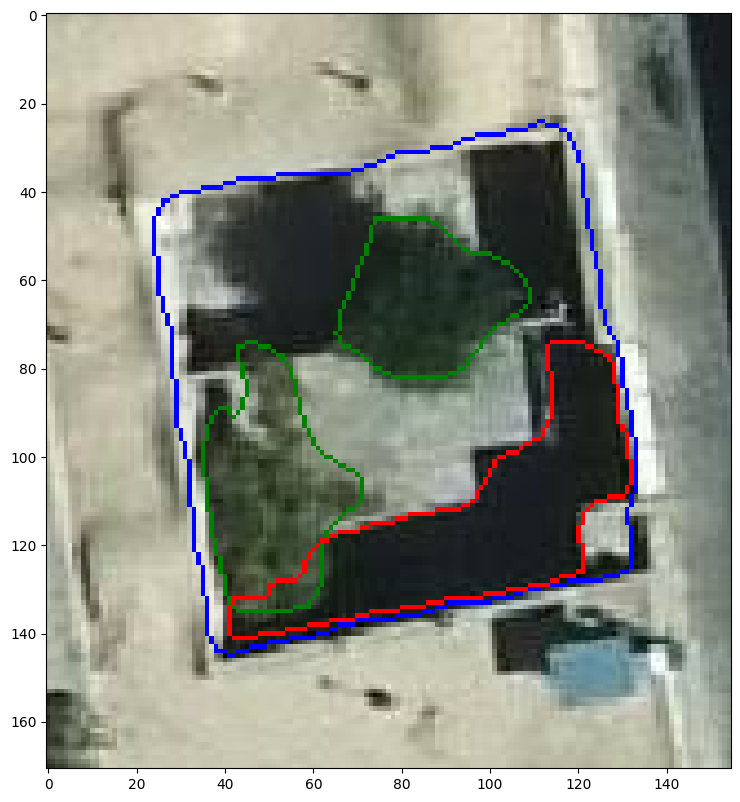

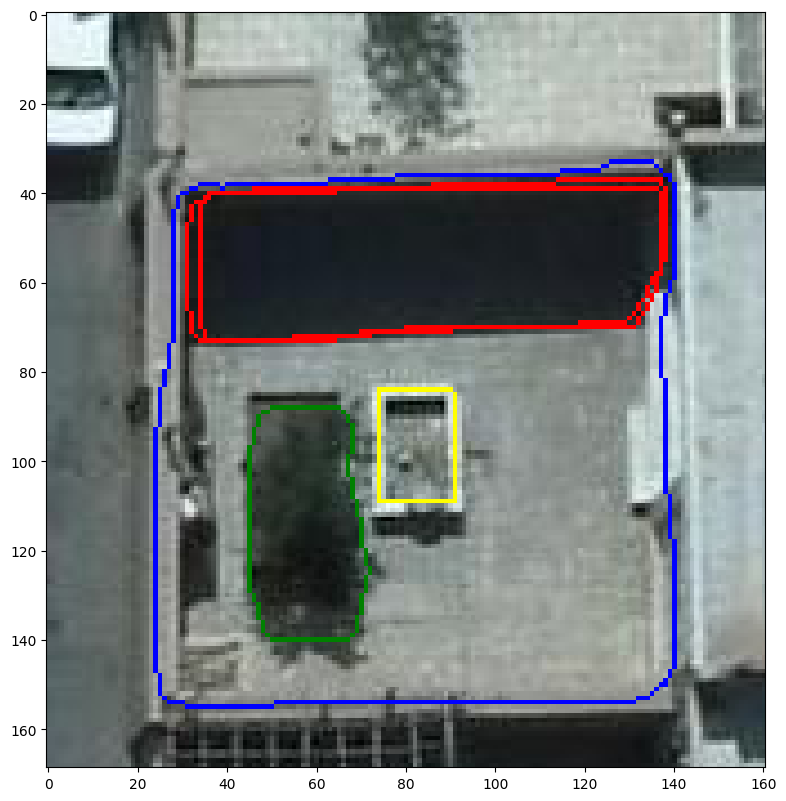

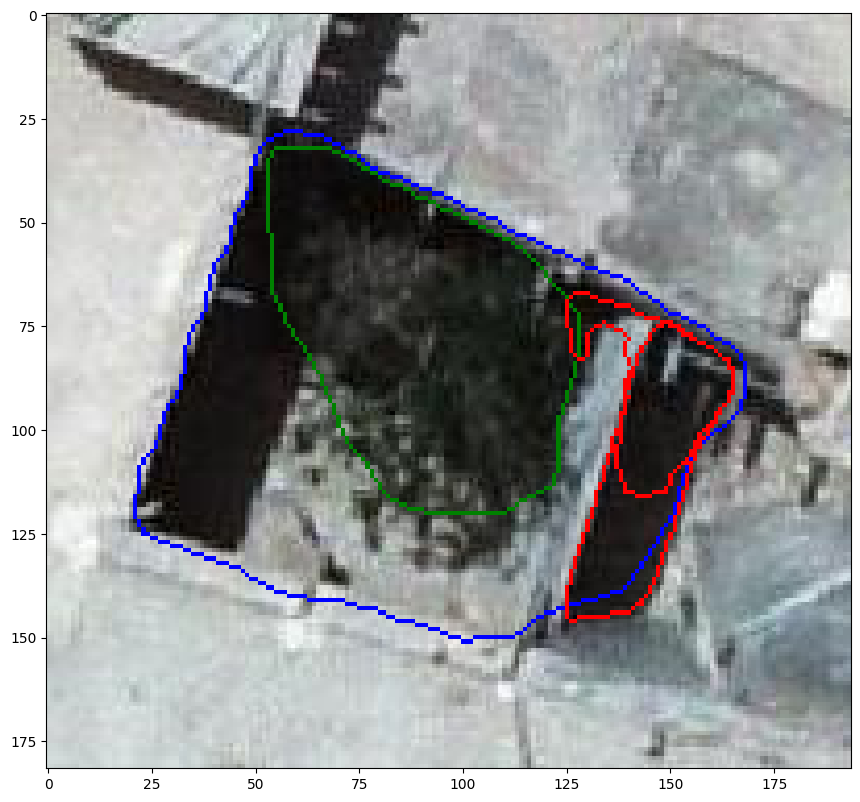

...

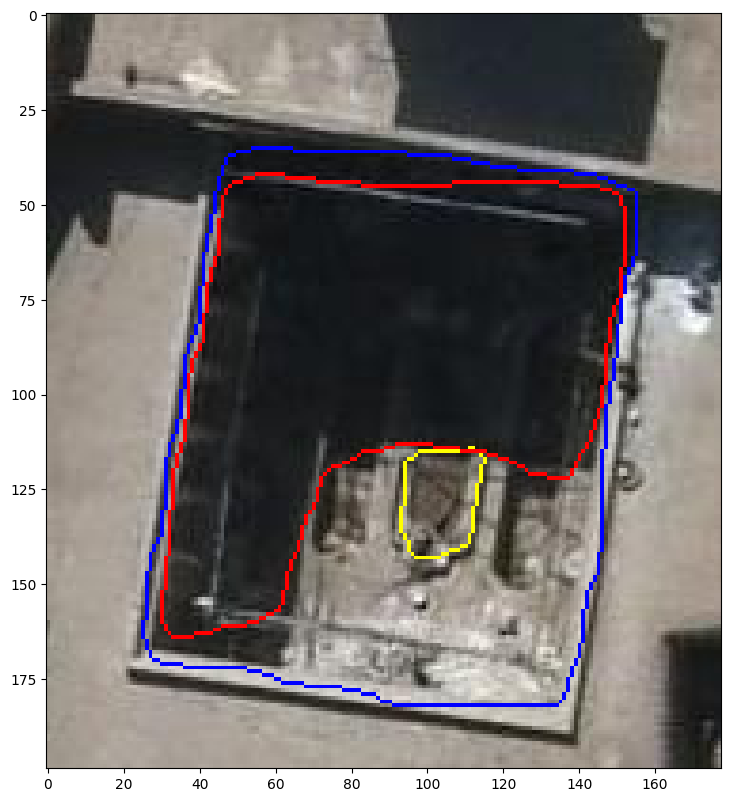

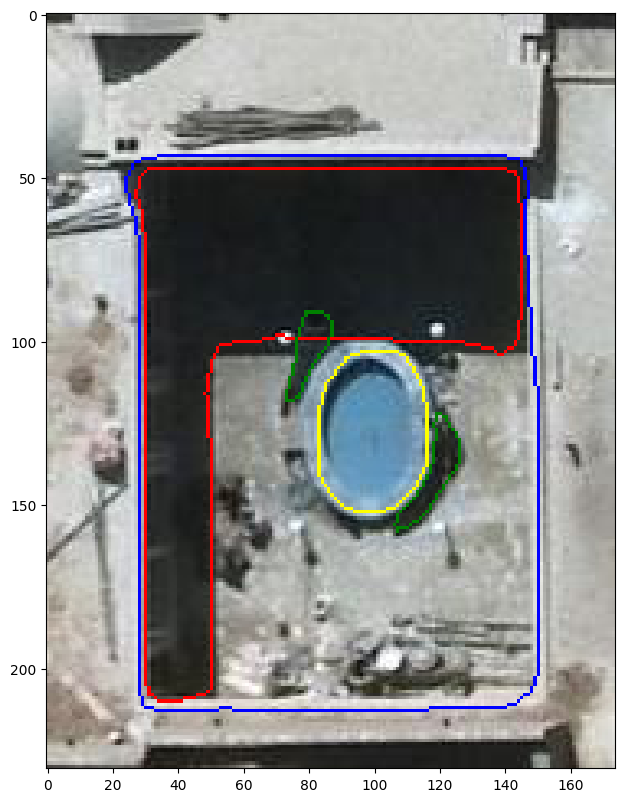

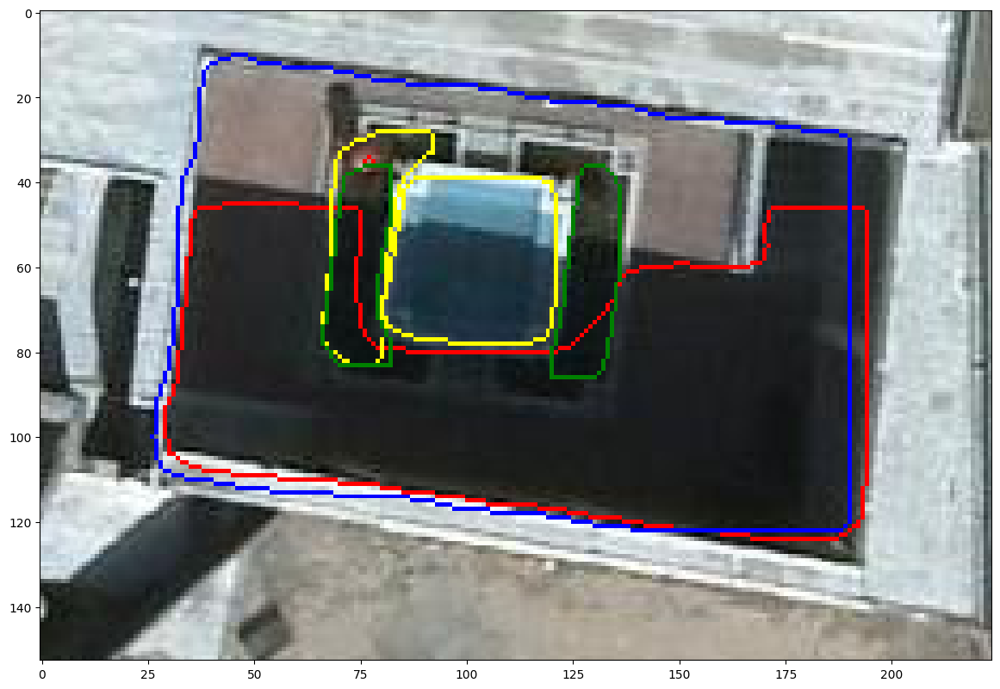

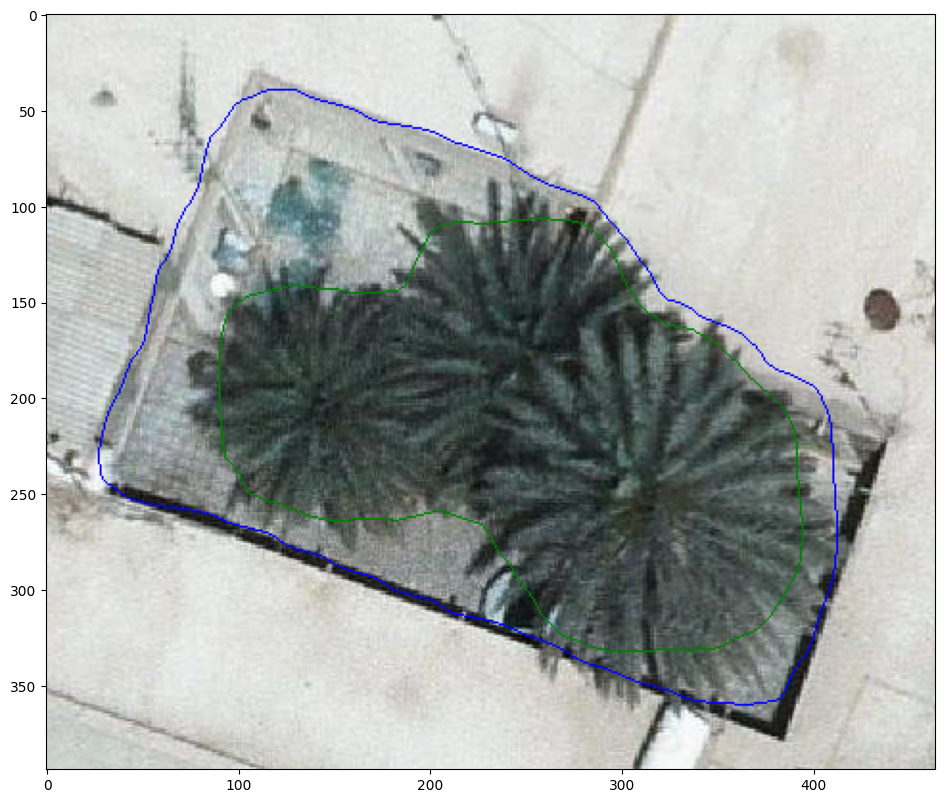

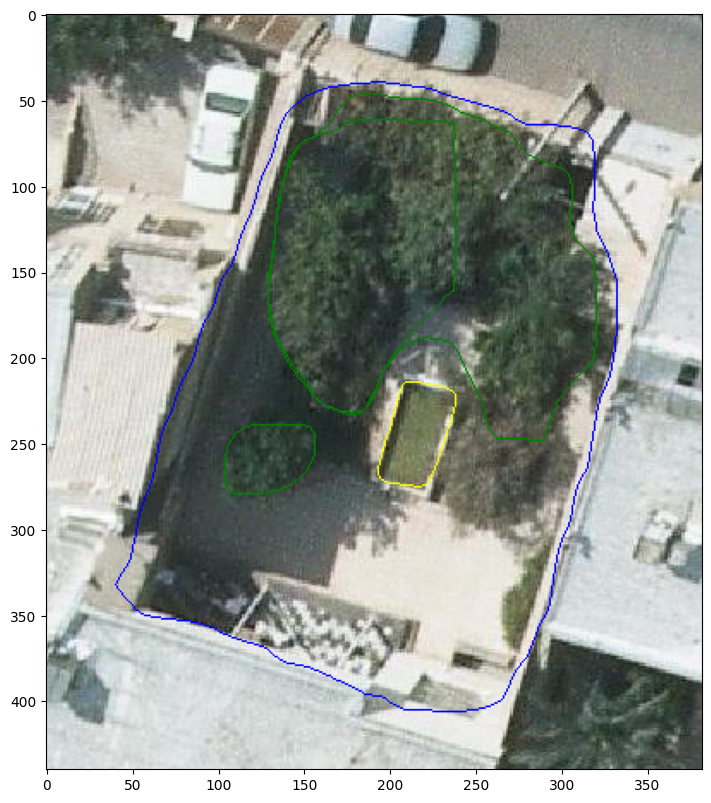

In [ ]:
from PIL import Image, ImageDraw, ImageShow
from PIL import ImagePath
import matplotlib.pyplot as plt

for d in test_dataset_dicts:    
    im = np.array(Image.open(d['file_name']))
    outputs = predictor(im)
    pred_classes = outputs['instances'].get('pred_classes').cpu().numpy()
    masks = outputs['instances'].get('pred_masks').cpu().permute(1, 2, 0).numpy()
    image_name = d['file_name']

    img = Image.open(image_name)
    img1 = ImageDraw.Draw(img)  

    line_colors = ["blue","red","green","yellow"]

    for i in range(masks.shape[2]):

      polygons = Mask(masks[:, :, i]).polygons()
      if len(polygons.segmentation[0]) > 2:    
          img1.polygon(polygons.segmentation[0], outline =line_colors[pred_classes[i]])

    plt.figure(figsize=(15, 10), dpi=100) 
    plt.imshow(img)


Save model

In [ ]:
cfg.MODEL.DEVICE = "cpu"
cfg.MODEL.RPN.BBOX_REG_LOSS_TYPE = "smooth_l1"
cfg.MODEL.RPN.BBOX_REG_LOSS_WEIGHT = 1.0
cfg.MODEL.ROI_BOX_HEAD.BBOX_REG_LOSS_TYPE = "smooth_l1"
cfg.MODEL.ROI_BOX_HEAD.BBOX_REG_LOSS_WEIGHT = 1.0

In [ ]:
import pickle

cfg.MODEL.WEIGHTS = 'model_final.pth'

filename = os.path.join(cfg.OUTPUT_DIR, 'config.pkl')
with open(filename, 'wb') as f:
     pickle.dump(cfg, f)

In [ ]:
# from google.colab import files

# torch.save(trainer.state_dict(), 'checkpoint_1.pth')

# # download checkpoint file
# files.download('checkpoint_1.pth')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# model_predictions = coco_instance_segmentation_dataset.create_annotation_set(annotation_task = 'Instance Segmentation', name = 'model_predictions')

# coco_instance_segmentation_dataset.add_annotations(annotations, annotation_set_id=model_predictions.id)

Progress 100% - 1/1 - elapsed 0:00:00.001000 - speed: 1000.00 img / s, ETA: 0:00:00
Acquiring data - completed                                                                           
Processing data - completed                                                                          
Data upload completed


In [ ]:
# coco_instance_segmentation_dataset.view()

By visualizing the predicted masks against the ground truth, we can go past summary performance metrics, and visually inspect model biases and iterate to improve it.

**Looking at once picture, we notice:** 

- The giraffe legs are not picked up by the model, this might be due to the tree occlusion

- A part of the gazelle's body (not present in the annotation) is mistaken as part of a zebra, possibly due to feature similarity in pose.

- The model is able to distinguish the zebra in the background, which was quite occluded. This is good!

In reality, we would look at all the pictures and at the model performance by class before drawing conclusions. Based on one picture, we can already come up with the following:

**Potential improvements**

- Add trees to the model training data, and give it more occluded examples. The occluded examples could be labelled as a different class initially, so we can see the count. And then experiments would say whether it's better to have it as unique class or not

- Annotate Gazelles as a separate class.

- Obvious one: train for more epochs and with more data

## References

- [How to train Detectron2 with Custom COCO Datasets](https://medium.com/@chengweizhang2012/how-to-train-detectron2-with-custom-coco-datasets-4d5170c9f389)
- [Detectron2](https://github.com/facebookresearch/detectron2)